In [11]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
# %pip install swig
# !pip install numpy torch wandb swig 'gymnasium[box2d]' matplotlib termcolor
# !pip install opencv-python

In [2]:
import test
from utils import *

# Reinforcement Learning Part 1: DQN
By Lawrence Liu and Tonmoy Monsoor
## Some General Instructions

- As before, please keep the names of the layer consistent with what is requested in model.py. Otherwise the test functions will not work

- You will need to fill in the model.py, the DQN.py file, the buffer.py file, and the
env_wrapper.py

DO NOT use Windows for this project, gymnasium does is not supported for windows and installing it will be a pain.

### Introduction to the Enviroment
We will be training a DQN agent to play the game of CarRacing. The agent will be trained to play the game using the pixels of the game as an input. The reward structure is as follows for each frame:
- -0.1 for each frame
- +1000/N where N is the number of tiles visited by the car in the episode

The overall goal of this game is to design a agent that is able to play the game with a average test score of above 600. In discrete mode the actions can take 5 actions,
- 0: Do Nothing
- 1: Turn Left
- 2: Turn Right
- 3: Accelerate
- 4: Brake

First let us visualize the game and understand the environment.

In [3]:
import gymnasium as gym
import numpy as np
env = gym.make('CarRacing-v2', continuous=False, render_mode='rgb_array')
env.np_random = np.random.RandomState(42)

In [5]:

# from IPython.display import HTML

# frames = []
# s, _ = env.reset()

# while True:
#     a = env.action_space.sample()
#     s, r, terminated, truncated, _ = env.step(a)
#     frames.append(s)
#     if terminated or truncated:
#         break


# anim = animate(frames)
# HTML(anim.to_jshtml())

So a couple things we can note:
- at the beginning of the game, we have 50 frames of the game slowly zooming into the car, we should ignore this period, ie no-op during this period.
- there is a black bar at the bottom of the screen, we should crop this out of the observation. 

In addition, another thing to note is that the current frame doesn't give much information about the velocity and acceleration of the car, and that the car does not move much for each frame.
### Environment Wrapper (5 points)
As a result, you will need to complete `EnvWrapper` in `env_wrapper.py`. You can find more information in the docstring for the wrapper, however the main idea is that it is a wrapper to the environment that does the following:
- skips the first 50 frames of the game
- crops out the black bar and reshapes the observation to a 84x84 image, as well as turning the resulting image to grayscale
- performs the actions for `skip_frames` frames
- stacks the last `num_frames` frames together to give the agent some information about the velocity and acceleration of the car.


In [4]:
from env_wrapper import EnvWrapper

test.test_wrapper(EnvWrapper)

Passed reset
Passed step


### CNN Model (5 points)
Now we are ready to build the model. Our architecture of the CNN model is the one proposed by Mnih et al in "Human-level control through deep reinforcement learning". Specifically this consists of the following layers:
- A convolutional layer with 32 filters of size 8x8 with stride 4 and relu activation
- A convolutional layer with 64 filters of size 4x4 with stride 2 and relu activation
- A convolutional layer with 64 filters of size 3x3 with stride 1 and relu activation
- A fully connected layer with 512 units and relu activation
- A fully connected layer with the number of outputs of the environment

Please implement this model `Nature_Paper_Conv` in `model.py` as well as the helper 
`MLP` class.

In [5]:
import model
test.test_model_DQN(model.Nature_Paper_Conv)

Passed


### DQN (40 points)
Now we are ready to implement the DQN algorithm. 

<!-- ![title](DQN.png) -->

#### Replay Buffer (5 points)
First start by implementing the DQN replay buffer `ReplayBufferDQN` in `buffer.py`. This buffer will store the transitions of the agent and sample them for training. 

In [6]:
from replay_buffer import ReplayBufferDQN

test.test_DQN_replay_buffer(ReplayBufferDQN)

Passed


In [7]:
import DQN
import utils
import torch 


#### DQN (15 points)
Now implement the `_optimize_model` and `sample_action` functions in `DQN` in `DQN.py`. The `_optimize_model` function will sample a batch of transitions from the replay buffer and update the model. The `sample_action` function will sample an action from the model given the current state. Train the model over 200 episdoes, validating every 50 episodes for 30 episodes, before testing the model for 50 episodes at the end.

In [9]:
# # import DQN
# # import utils
# # import torch 


trainerDQN = DQN.DQN(EnvWrapper(env),
                model.Nature_Paper_Conv,
                lr = 0.00025,
                gamma = 0.95,
                buffer_size=100000,
                batch_size=32,
                loss_fn = "mse_loss",
                use_wandb = False,
                device = 'cpu',
                seed = 42,
                epsilon_scheduler = utils.exponential_decay(1, 700,0.1),
                #save_path = utils.get_save_path("DQN","./runs/"))
                save_path = '/Users/zilaiwang/Downloads/Student-Version/runs/DQN/run6')

# trainerDQN.train(200,50,30,50,50)
trainerDQN.load_model("best")
                
                

Please include a plot of the training and validation rewards over the episodes in the report. An additional question to answer is does the loss matter in DQN? Why or why not?



We can also draw a animation of the car in one game, the code is provided below

Answer:

In DQN, while the loss is an important indicator of how well the network is learning to predict the expected rewards, it is not the only measure of success. The actual performance of the DQN is better evaluated by the rewards it accumulates during training, which reflect how well it is performing the task it is learning. Therefore, both loss and accumulated rewards are essential metrics to monitor during the training of a DQN.



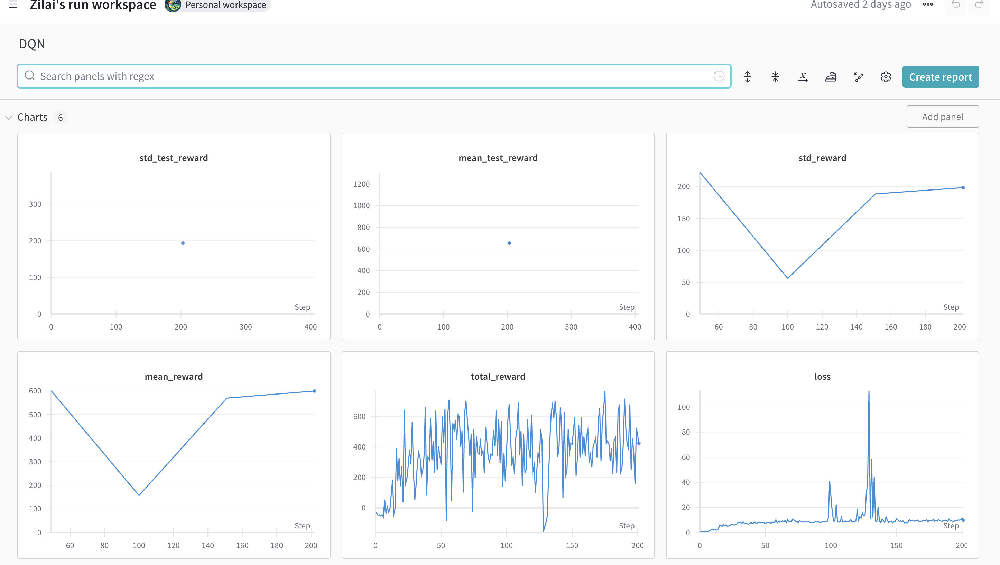

In [1]:
'''
Test Mean Reward: 654.0619981895143 Test Std Reward: 193.30109552326448
'''
# Display the image of the loss curve
from IPython.display import Image
Image(filename='DQN.png')

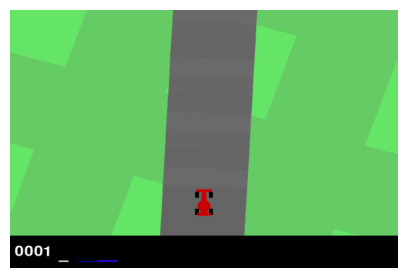

In [ ]:
# eval_env = gym.make('CarRacing-v2', continuous=True, render_mode='rgb_array')
# eval_env = EnvWrapper(eval_env)

# total_rewards, frames = trainerDQN.play_episode(0,True,42)
# anim = animate(frames)
# HTML(anim.to_jshtml())

### Double DQN
In the original paper, where the algorithim is shown above, the estimated target Q value was computed using the current Q network's weights. However, this can lead to overestimation of the Q values. To mitigate this, we can use the target network to compute the target Q value. This is known as Double DQN.
#### Hard updating Target Network (5 points)
Original implementations for this involved hard updates, where the model weights were copied to the target network every C steps. This is known as hard updating. This was what was used in the Nature Paper by Mnih et al 2015 "Human-level control through deep reinforcement learning"

Please implement this by implementing the `_optimize_model` and `_update_model` classes in `HardUpdateDQN` in `DQN.py`.


In [13]:
import DQN
import utils
import torch 
trainerHardUpdateDQN = DQN.HardUpdateDQN(EnvWrapper(env),
                model.Nature_Paper_Conv,
                update_freq = 100,
                lr = 0.00025,
                gamma = 0.95,
                buffer_size=100000,
                batch_size=32,
                loss_fn = "mse_loss",
                use_wandb = True,
                device = 'cpu',
                seed = 42,
                epsilon_scheduler = utils.exponential_decay(1, 1000,0.1),
                save_path = utils.get_save_path("DoubleDQN_HardUpdates/","./runs/"))

trainerHardUpdateDQN.train(200,50,30,50,50)

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


saving to ./runs/DoubleDQN_HardUpdates/run13


wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:wandb: Appending key for api.wandb.ai to your netrc file: /Users/zilaiwang/.netrc


Episode: 1: Time: 18.21490502357483 Total Reward: -20.781249999999837 Avg_Loss: 0.9699822610161107
Episode: 2: Time: 24.53150486946106 Total Reward: -55.84337349397677 Avg_Loss: 0.8905598489614595
Episode: 3: Time: 24.59444785118103 Total Reward: -75.76923076923082 Avg_Loss: 0.8201869981472983
Episode: 4: Time: 23.575483083724976 Total Reward: 13.391608391608475 Avg_Loss: 0.7840833302211612
Episode: 5: Time: 23.7066171169281 Total Reward: -59.53900709219951 Avg_Loss: 0.7646822856441766
Episode: 6: Time: 23.251431226730347 Total Reward: -5.071942446043137 Avg_Loss: 0.7813882574658183
Episode: 7: Time: 23.43156886100769 Total Reward: -32.716262975779166 Avg_Loss: 0.828343575632497
Episode: 8: Time: 23.387376070022583 Total Reward: -59.41281138790083 Avg_Loss: 0.88301738733504
Episode: 9: Time: 23.412166833877563 Total Reward: -36.780821917808595 Avg_Loss: 0.8454114589996699
Episode: 10: Time: 23.09039282798767 Total Reward: -80.0746268656714 Avg_Loss: 0.829192080871523
Episode: 11: Time:

In [8]:
# '''
# load best model of hard update DQN
# '''
# trainerHardUpdateDQN_2 = DQN.HardUpdateDQN(EnvWrapper(env),
#                 model.Nature_Paper_Conv,
#                 update_freq = 100,
#                 lr = 0.00025,
#                 gamma = 0.95,
#                 buffer_size=100000,
#                 batch_size=32,
#                 loss_fn = "mse_loss",
#                 use_wandb = False,
#                 device = 'cpu',
#                 seed = 42,
#                 epsilon_scheduler = utils.exponential_decay(1, 1000,0.1),
#                 save_path = '/Users/zilaiwang/Downloads/Student-Version/runs/DoubleDQN_HardUpdates/run13')

# trainerHardUpdateDQN_2.load_model("best")


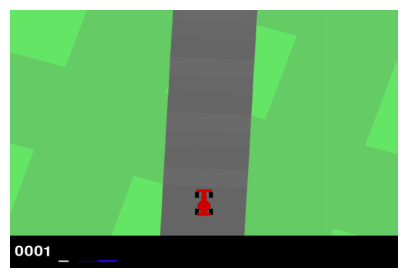

In [9]:
total_rewards, frames = trainerHardUpdateDQN_2.play_episode(0,True,42)
anim = animate(frames)
HTML(anim.to_jshtml())

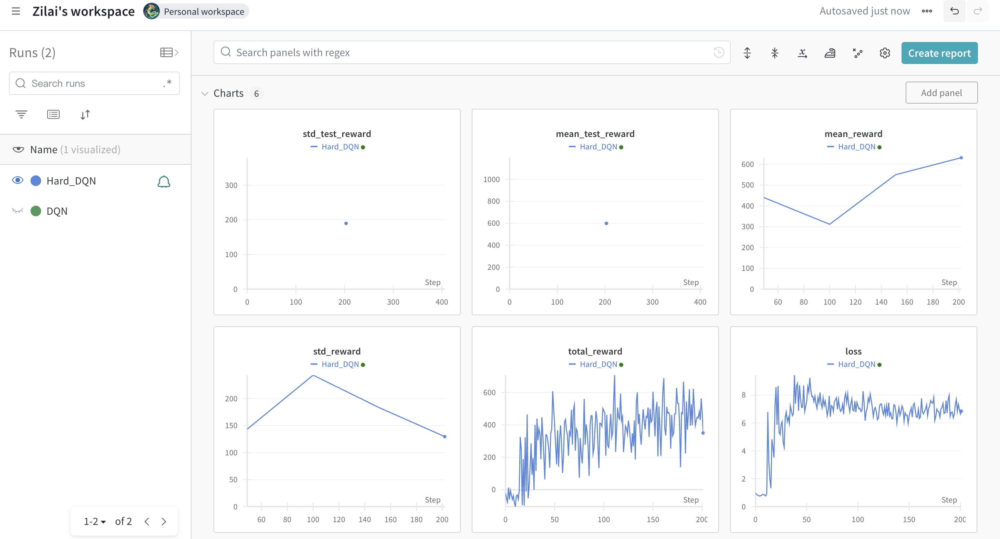

In [1]:
'''
Test Mean Reward: 598.6860630379143 Test Std Reward: 189.70470916046344
'''
# Display the image of the loss curve
from IPython.display import Image
Image(filename='hard_DQN.png')

#### Soft Updates (5 points)
A more recent improvement is to use soft updates, also known as Polyak averaging, where the target network is updated with a small fraction of the current model weights every step. In other words:
$$\theta_{target} = \tau \theta_{model} + (1-\tau) \theta_{target}$$
for some $\tau << 1$
Please implement this by implementing the `_update_model` class in `SoftUpdateDQN` in `DQN.py`.

In [10]:
traineSoftUpdateDQN = DQN.SoftUpdateDQN(EnvWrapper(env),
                model.Nature_Paper_Conv,
                tau = 0.01,
                update_freq = 1,
                lr = 0.00025,
                gamma = 0.95,
                buffer_size=100000,
                batch_size=32,
                loss_fn = "mse_loss",
                use_wandb = True,
                device = 'cpu',
                seed = 42,
                epsilon_scheduler = utils.exponential_decay(1, 1000,0.1),
                save_path = utils.get_save_path("DoubleDQN_SoftUpdates","./runs/"))

traineSoftUpdateDQN.train(200,50,30,50,50)

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


saving to ./runs/DoubleDQN_SoftUpdates/run2


wandb: Currently logged in as: zilai. Use `wandb login --relogin` to force relogin


Episode: 1: Time: 13.573356866836548 Total Reward: -31.026936026936216 Avg_Loss: 0.7162717716281961
Episode: 2: Time: 18.986002922058105 Total Reward: -38.859649122807106 Avg_Loss: 0.7568331731154638
Episode: 3: Time: 17.89383888244629 Total Reward: -76.01265822784814 Avg_Loss: 0.704675270729706
Episode: 4: Time: 17.838648080825806 Total Reward: -64.49152542372967 Avg_Loss: 0.6666618674179586
Episode: 5: Time: 17.673006057739258 Total Reward: -66.51898734177271 Avg_Loss: 0.6164567505455568
Episode: 6: Time: 17.961308002471924 Total Reward: -59.480874316940785 Avg_Loss: 0.5164292746325251
Episode: 7: Time: 17.60673713684082 Total Reward: -70.9759759759763 Avg_Loss: 0.47994983014689774
Episode: 8: Time: 17.673133850097656 Total Reward: -14.708029197080146 Avg_Loss: 0.5359848908954808
Episode: 9: Time: 18.14115309715271 Total Reward: -62.53246753246839 Avg_Loss: 0.6177335780489595
Episode: 10: Time: 17.209110021591187 Total Reward: -41.04316546762644 Avg_Loss: 0.6101444427221387
Episode: 

In [8]:
# traineSoftUpdateDQN_2 = DQN.SoftUpdateDQN(EnvWrapper(env),
#                 model.Nature_Paper_Conv,
#                 tau = 0.01,
#                 update_freq = 1,
#                 lr = 0.00025,
#                 gamma = 0.95,
#                 buffer_size=100000,
#                 batch_size=32,
#                 loss_fn = "mse_loss",
#                 use_wandb = False,
#                 device = 'cpu',
#                 seed = 42,
#                 epsilon_scheduler = utils.exponential_decay(1, 1000,0.1),
                
#                 save_path = '/Users/zilaiwang/Downloads/Student-Version/runs/DoubleDQN_SoftUpdates/run2')


# traineSoftUpdateDQN_2.load_model("best")



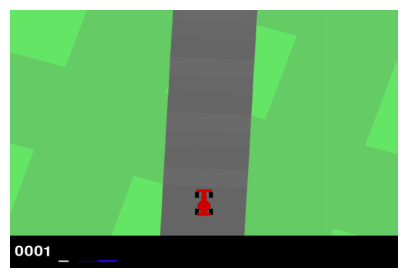

In [9]:
total_rewards, frames = traineSoftUpdateDQN_2.play_episode(0,True,42)
anim = animate(frames)
HTML(anim.to_jshtml())

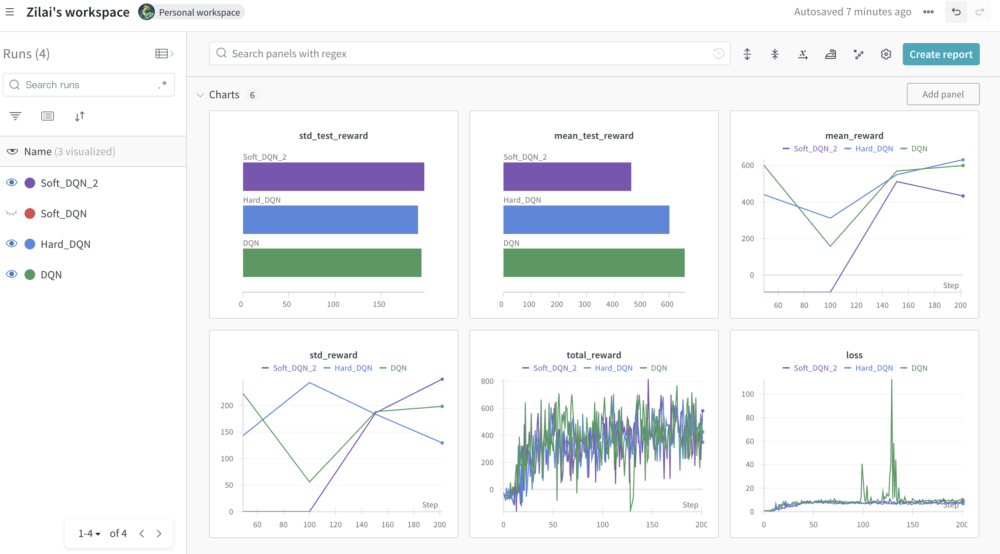

In [10]:
'''
Test Mean Reward: 460.39877053008547 Test Std Reward: 196.25381334666073
'''
# Display the image of the loss curve
from IPython.display import Image
Image(filename='soft_dqn.png')

#### Questions:
- Which method performed better? (5 points)
- If we modify the $\tau$ for soft updates or the $C$ for the hard updates, how does this affect the performance of the model, come up with a intuition for this, then experimentally verify this.
 (5 points)


Q1:

I think soft updates perform better based on the animation of the car in one game. Although the test mean reward of Soft update is smaller and std is larger, I found it is not reliable to evaluate the system just based on these two criteria (mean and std of total test reward). While the seed is fixed, the results will be different for each implementation. From the animation, I observed that the soft-update DQN system can provide more smooth moving trajectory. That is because Hard updates method can lead to potentially large and abrupt changes in the policy against which the values are computed, which might cause instability in training due to the target suddenly shifting. On contrast, soft updates will result in smoother changes to the target network, providing a more stable learning process as the target changes less dramatically from one update to the next.

Q2:

For soft update:

i. Decreasing $\tau$  (making it closer to 0) in soft updates makes the target network weights change more slowly, potentially leading to more stable but slower convergence, as the target network lags more significantly behind the rapidly improving main network.

ii.Increasing $\tau$ makes the target network more closely track the main network, speeding up convergence but potentially at the cost of stability.

For hard update:

i.Increasing C in hard updates means less frequent updates of the target network, which can stabilize training but might slow down convergence if the target becomes too outdated.

ii.Decreasing C makes the target network update more frequently, which can destabilize training due to frequent shifts in the target policy.



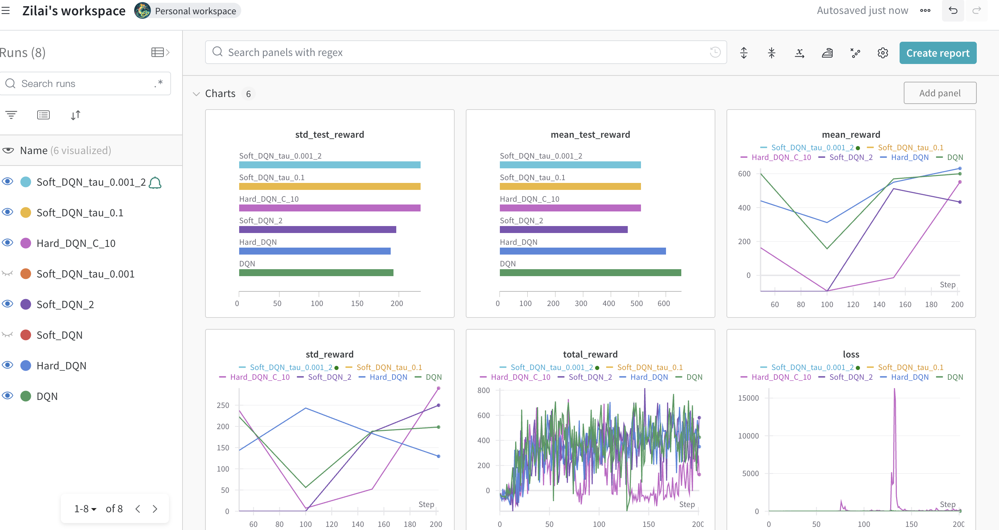

In [1]:
'''
All the experiment results
'''

# Display the image of the loss curve
from IPython.display import Image
Image(filename='all_DQN.png')

In [1]:
import test
from utils import *
import gymnasium as gym
import numpy as np
env = gym.make('CarRacing-v2', continuous=False, render_mode='rgb_array')
env.np_random = np.random.RandomState(42)
from env_wrapper import EnvWrapper
import model
from replay_buffer import ReplayBufferDQN
import DQN
import utils
import torch 

In [2]:
'''
For soft update DQN, set the tau = 0.001, update_freq = 1:

'''
traineSoftUpdateDQN = DQN.SoftUpdateDQN(EnvWrapper(env),
                model.Nature_Paper_Conv,
                tau = 0.001,
                update_freq = 1,
                lr = 0.00025,
                gamma = 0.95,
                buffer_size=100000,
                batch_size=32,
                loss_fn = "mse_loss",
                use_wandb = True,
                device = 'cpu',
                seed = 42,
                epsilon_scheduler = utils.exponential_decay(1, 1000,0.1),
                save_path = utils.get_save_path("DoubleDQN_SoftUpdates","./runs/"))

traineSoftUpdateDQN.train(200,50,30,50,50)

saving to ./runs/DoubleDQN_SoftUpdates/run5


Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: zilai. Use `wandb login --relogin` to force relogin


Episode: 1: Time: 14.434556245803833 Total Reward: -37.30769230769278 Avg_Loss: 0.7990861644458239
Episode: 2: Time: 19.346009969711304 Total Reward: -25.656934306569227 Avg_Loss: 0.842639231835218
Episode: 3: Time: 18.572932720184326 Total Reward: -70.00000000000038 Avg_Loss: 0.8636583951497528
Episode: 4: Time: 19.162180185317993 Total Reward: -37.76094276094334 Avg_Loss: 0.7665358170898271
Episode: 5: Time: 18.06009292602539 Total Reward: -10.49295774647954 Avg_Loss: 0.7556409079800633
Episode: 6: Time: 17.80974793434143 Total Reward: -72.09923664122167 Avg_Loss: 0.8766632091347911
Episode: 7: Time: 18.272754907608032 Total Reward: -40.31250000000048 Avg_Loss: 0.7610269503026199
Episode: 8: Time: 18.021416187286377 Total Reward: -15.289855072464135 Avg_Loss: 0.8119377464118624
Episode: 9: Time: 17.681478023529053 Total Reward: 3.4848484848486425 Avg_Loss: 0.851212703959406
Episode: 10: Time: 17.993348121643066 Total Reward: 45.522875816994016 Avg_Loss: 1.0122351734233754
Episode: 11

In [2]:
'''
For soft update DQN, set the tau = 0.1, update_freq = 1
'''
traineSoftUpdateDQN = DQN.SoftUpdateDQN(EnvWrapper(env),
                model.Nature_Paper_Conv,
                tau = 0.1,
                update_freq = 1,
                lr = 0.00025,
                gamma = 0.95,
                buffer_size=100000,
                batch_size=32,
                loss_fn = "mse_loss",
                use_wandb = True,
                device = 'cpu',
                seed = 42,
                epsilon_scheduler = utils.exponential_decay(1, 1000,0.1),
                save_path = utils.get_save_path("DoubleDQN_SoftUpdates","./runs/"))

traineSoftUpdateDQN.train(200,50,30,50,50)

saving to ./runs/DoubleDQN_SoftUpdates/run4


Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: zilai. Use `wandb login --relogin` to force relogin


Episode: 1: Time: 14.600630044937134 Total Reward: -37.30769230769278 Avg_Loss: 0.7990861644458239
Episode: 2: Time: 19.246567964553833 Total Reward: -25.656934306569227 Avg_Loss: 0.842639231835218
Episode: 3: Time: 17.946235179901123 Total Reward: -70.00000000000038 Avg_Loss: 0.8636583951497528
Episode: 4: Time: 18.07844614982605 Total Reward: -37.76094276094334 Avg_Loss: 0.7665358170898271
Episode: 5: Time: 17.919367790222168 Total Reward: -10.49295774647954 Avg_Loss: 0.7556409079800633
Episode: 6: Time: 17.492295265197754 Total Reward: -72.09923664122167 Avg_Loss: 0.8766632091347911
Episode: 7: Time: 17.352349996566772 Total Reward: -40.31250000000048 Avg_Loss: 0.7610269503026199
Episode: 8: Time: 17.513041019439697 Total Reward: -15.289855072464135 Avg_Loss: 0.8119377464118624
Episode: 9: Time: 17.265432834625244 Total Reward: 3.4848484848486425 Avg_Loss: 0.851212703959406
Episode: 10: Time: 17.51817274093628 Total Reward: 45.522875816994016 Avg_Loss: 1.0122351734233754
Episode: 11

In [2]:
'''
For hard update DQN, set the update_freq = 10

'''

trainerHardUpdateDQN = DQN.HardUpdateDQN(EnvWrapper(env),
                model.Nature_Paper_Conv,
                update_freq = 10,
                lr = 0.00025,
                gamma = 0.95,
                buffer_size=100000,
                batch_size=32,
                loss_fn = "mse_loss",
                use_wandb = True,
                device = 'cpu',
                seed = 42,
                epsilon_scheduler = utils.exponential_decay(1, 1000,0.1),
                save_path = utils.get_save_path("DoubleDQN_HardUpdates/","./runs/"))

trainerHardUpdateDQN.train(200,50,30,50,50)

saving to ./runs/DoubleDQN_HardUpdates/run14


Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: zilai. Use `wandb login --relogin` to force relogin


Episode: 1: Time: 15.818092823028564 Total Reward: -37.30769230769278 Avg_Loss: 0.7990861644458239
Episode: 2: Time: 19.41635799407959 Total Reward: -25.656934306569227 Avg_Loss: 0.842639231835218
Episode: 3: Time: 18.49020528793335 Total Reward: -70.00000000000038 Avg_Loss: 0.8636583951497528
Episode: 4: Time: 17.844765186309814 Total Reward: -37.76094276094334 Avg_Loss: 0.7665358170898271
Episode: 5: Time: 17.54720377922058 Total Reward: -10.49295774647954 Avg_Loss: 0.7556409079800633
Episode: 6: Time: 17.61268901824951 Total Reward: -72.09923664122167 Avg_Loss: 0.8766632091347911
Episode: 7: Time: 17.390843152999878 Total Reward: -40.31250000000048 Avg_Loss: 0.7610269503026199
Episode: 8: Time: 17.888354063034058 Total Reward: -15.289855072464135 Avg_Loss: 0.8119377464118624
Episode: 9: Time: 17.649399042129517 Total Reward: 3.4848484848486425 Avg_Loss: 0.851212703959406
Episode: 10: Time: 17.6357479095459 Total Reward: 45.522875816994016 Avg_Loss: 1.0122351734233754
Episode: 11: Ti